# Import librairies

In [2]:
import pandas as pd, numpy as np, os, warnings, seaborn as sns
from datetime import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

# %matplotlib inline
%pylab inline

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
    
sns.set(font_scale=2)
warnings.filterwarnings(action="ignore")

os.chdir("C:/Users/etien/Documents/CCI/_HUB/cours/2024-2025/big_data/_git/donnees")


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# Outils

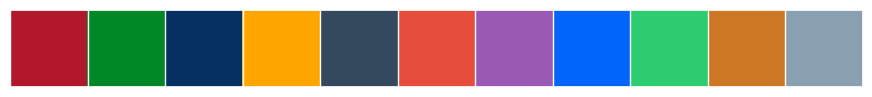

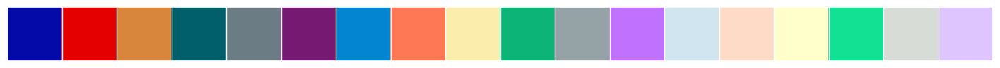

In [3]:
palette_large = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
palette = ['#b2182b','#008827','#053061','#ffa500', '#34495e', '#e74c3c', 
          '#9b59b6', '#0165fc','#2ecc71', '#cb7723', '#89a0b0']
sns.palplot(sns.color_palette(palette))
sns.palplot(sns.color_palette(palette_large))
plt.show()

In [4]:
repertoireRacine  = '.'
nomProjet         = 'GraphsMonoVariable'

repertoireProjet  = os.path.join(repertoireRacine, nomProjet)
repertoireDonnees = os.path.join(repertoireProjet, 'repertoire.donnees')
repertoireImages  = os.path.join(repertoireProjet, 'repertoire.images')


def controleExistenceRepertoire( repertoire, create_if_needed=True):
    """Voir si le répertoire existe. S'il n'existe pas il est créé."""
    path_exists = os.path.exists(repertoire)
    if path_exists:
        if not os.path.isdir(repertoire):
            raise Exception("Trouvé le nom  "+repertoire +" mais c'est un fichier, pas un répertoire")
            # return False
        return True
    if create_if_needed:
        os.makedirs(repertoire)

def sauvegarderImage( fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    plt.savefig(os.path.join(repertoireImages,
                             fichier+f"--{dt.now().strftime('%Y_%m_%d_%H.%M.%S')}.png"), 
                             dpi=600, 
                             bbox_inches='tight')

def sauvegarderImageSNS( sns_plot, fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    fig = sns_plot.get_figure()
    fig.savefig(os.path.join(repertoireImages,fichier+'.png'))
    
controleExistenceRepertoire(repertoireProjet);
controleExistenceRepertoire(repertoireDonnees);
controleExistenceRepertoire(repertoireImages);

In [5]:
donnees = pd.read_parquet('donnees_meteo.gzip', engine='pyarrow')

In [6]:
donnees.head()

DirectionVent  \
Nom       Latitude Longitude Altitude Zone DateHeure                            
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00            0.0   
                                           2017-01-01 03:00:00            0.0   
                                           2017-01-01 06:00:00            0.0   
                                           2017-01-01 09:00:00            0.0   
                                           2017-01-01 12:00:00            0.0   

                                                                VitesseVent  \
Nom       Latitude Longitude Altitude Zone DateHeure                          
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00          0.0   
                                           2017-01-01 03:00:00          0.0   
                                           2017-01-01 06:00:00          0.0   
                                           2017-01-01 09:00:00          0.0   
                                           2017-01-01 12:00:00          0.0   

                                                                Temperature  \
Nom       Latitude Longitude Altitude Zone DateHeure                          
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00         -3.9   
                                           2017-01-01 03:00:00         -5.1   
                                           2017-01-01 06:00:00         -4.1   
                                           2017-01-01 09:00:00         -2.2   
                                           2017-01-01 12:00:00         -0.9   

                                                                Humidite  \
Nom       Latitude Longitude Altitude Zone DateHeure                       
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00      96.0   
                                           2017-01-01 03:00:00      94.0   
                                           2017-01-01 06:00:00      96.0   
                                           2017-01-01 09:00:00      97.0   
                                           2017-01-01 12:00:00      98.0   

                                                                Visibilite  \
Nom       Latitude Longitude Altitude Zone DateHeure                         
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00        1.74   
                                           2017-01-01 03:00:00        7.36   
                                           2017-01-01 06:00:00        3.50   
                                           2017-01-01 09:00:00        4.00   
                                           2017-01-01 12:00:00        4.00   

                                                                Pression  \
Nom       Latitude Longitude Altitude Zone DateHeure                       
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00    1018.0   
                                           2017-01-01 03:00:00    1015.8   
                                           2017-01-01 06:00:00    1013.1   
                                           2017-01-01 09:00:00    1011.7   
                                           2017-01-01 12:00:00    1010.3   

                                                                Mois  Annee  \
Nom       Latitude Longitude Altitude Zone DateHeure                          
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00     1   2017   
                                           2017-01-01 03:00:00     1   2017   
                                           2017-01-01 06:00:00     1   2017   
                                           2017-01-01 09:00:00     1   2017   
                                           2017-01-01 12:00:00     1   2017   

                                                                AnneeMois  \
Nom       Latitude Longitude Altitude Zone DateHeure                        
Abbeville 50.136   1.834     69       NO   2017-01-01 00:00:00     

In [7]:
donnees.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 831725 entries, ('Abbeville', 50.136, 1.834, 69, 'NO', Timestamp('2017-01-01 00:00:00')) to ('Bastia', 42.540667, 9.485167, 10, 'SE', Timestamp('2023-10-31 21:00:00'))
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   DirectionVent  829027 non-null  float64
 1   VitesseVent    829125 non-null  float64
 2   Temperature    819837 non-null  float64
 3   Humidite       819239 non-null  float64
 4   Visibilite     784564 non-null  float64
 5   Pression       820839 non-null  float64
 6   Mois           831725 non-null  int32  
 7   Annee          831725 non-null  int32  
 8   AnneeMois      831725 non-null  int32  
 9   AnneeJour      831725 non-null  int32  
 10  Semaine        831725 non-null  UInt32 
 11  MoisJour       831725 non-null  int32  
 12  JourA          831725 non-null  int32  
 13  Precipitation  818709 non-null  float64
dtypes: UInt32(1), float64(7)

In [8]:
donnees.isna().sum()

DirectionVent     2698
VitesseVent       2600
Temperature      11888
Humidite         12486
Visibilite       47161
Pression         10886
Mois                 0
Annee                0
AnneeMois            0
AnneeJour            0
Semaine              0
MoisJour             0
JourA                0
Precipitation    13016
dtype: int64

In [9]:
donnees.columns

Index(['DirectionVent', 'VitesseVent', 'Temperature', 'Humidite', 'Visibilite',
       'Pression', 'Mois', 'Annee', 'AnneeMois', 'AnneeJour', 'Semaine',
       'MoisJour', 'JourA', 'Precipitation'],
      dtype='object')

# Histogramme

<img src="https://raw.githubusercontent.com/rbizoi/PythonFormation/refs/heads/main/images/hist03.png" width="850">

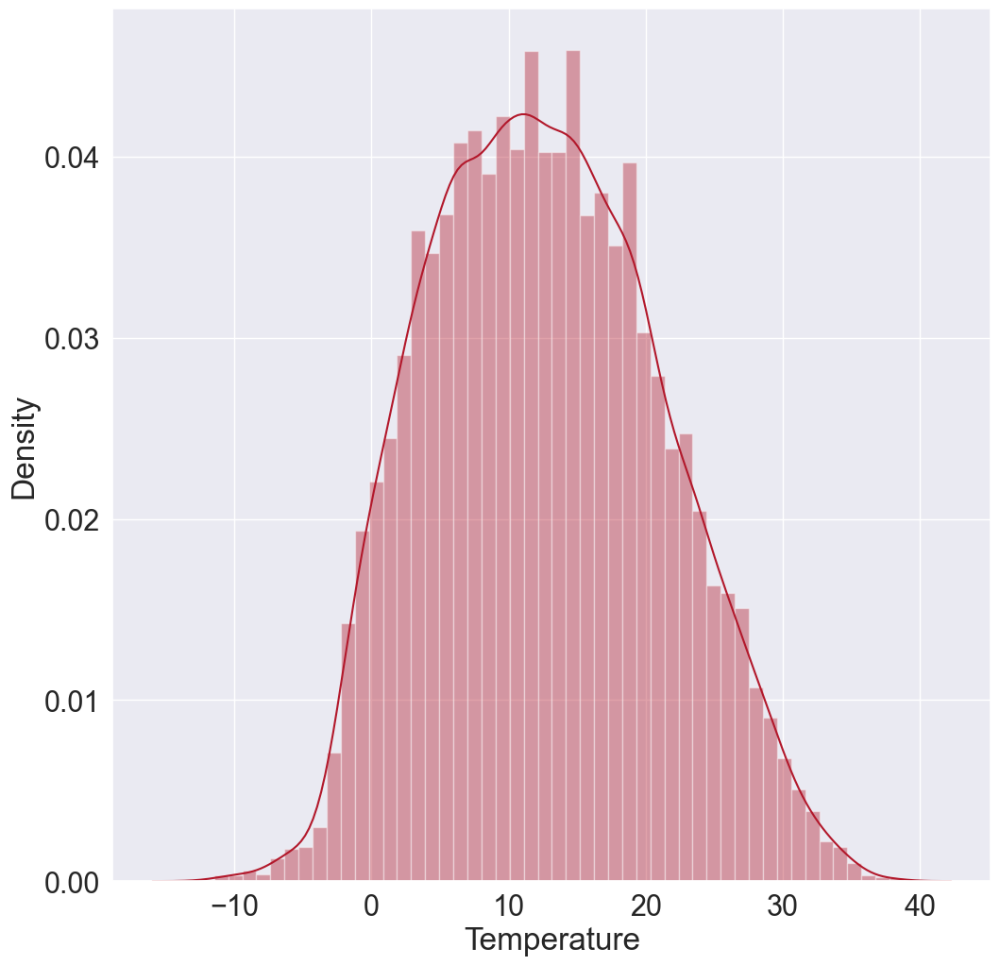

In [10]:
plt.figure(figsize=(12,12))
sns.distplot(donnees.loc[('Strasbourg'),'Temperature'], color=palette[0])
plt.show()

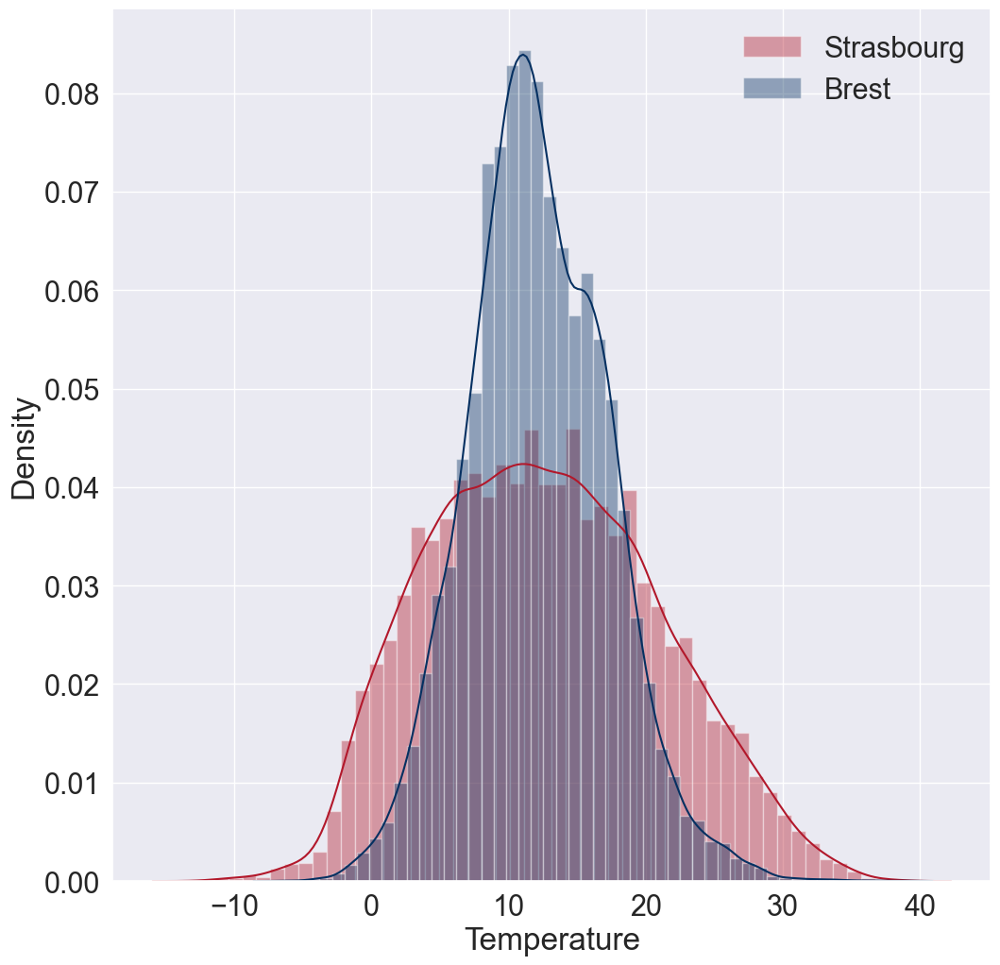

In [11]:
plt.figure(figsize=(12,12))
sns.distplot(donnees.loc[('Strasbourg'),'Temperature'], label='Strasbourg', color=palette[0])
sns.distplot(donnees.loc[('Brest'),'Temperature'], label='Brest', color=palette[2])
plt.legend();
plt.show()

# BoxPlot

<img src="https://raw.githubusercontent.com/rbizoi/PythonFormation/refs/heads/main/images/boxplot.png" width="850">

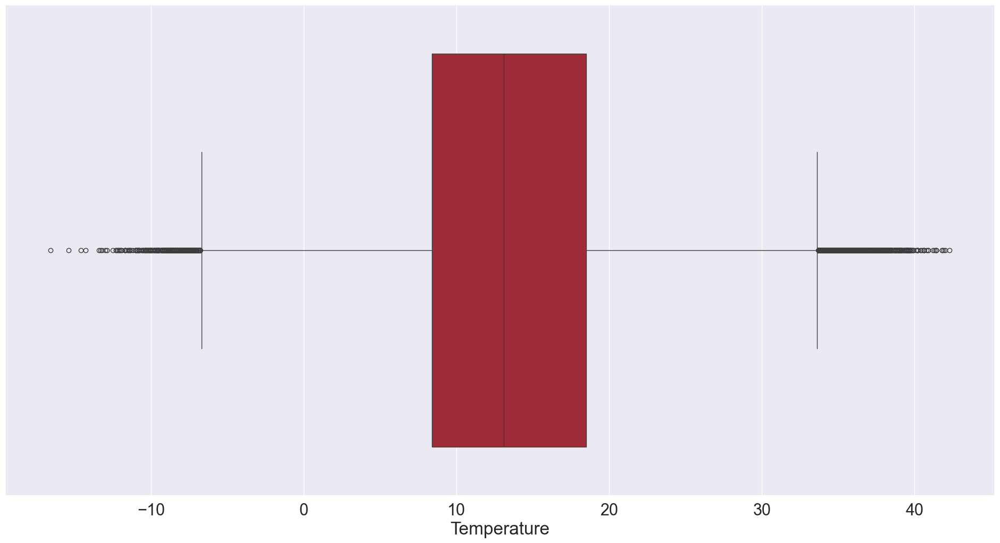

In [12]:
plt.figure(figsize=(24,12))
sns.boxplot(data=donnees.Temperature, orient='h', color=palette[0]);
plt.show()

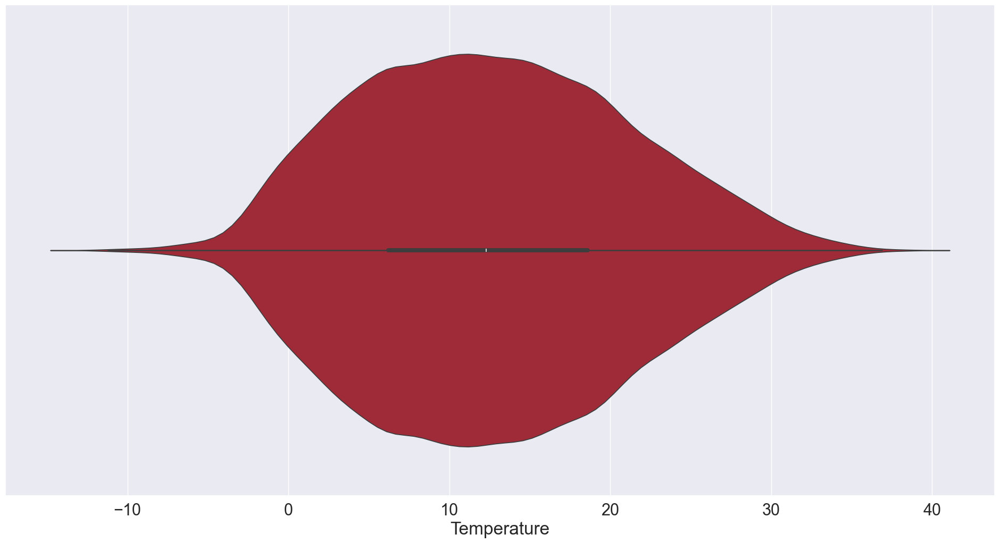

In [13]:
plt.figure(figsize=(24,12))
sns.violinplot(data=donnees.loc[('Strasbourg'),'Temperature'], orient='h', color=palette[0])
plt.show()

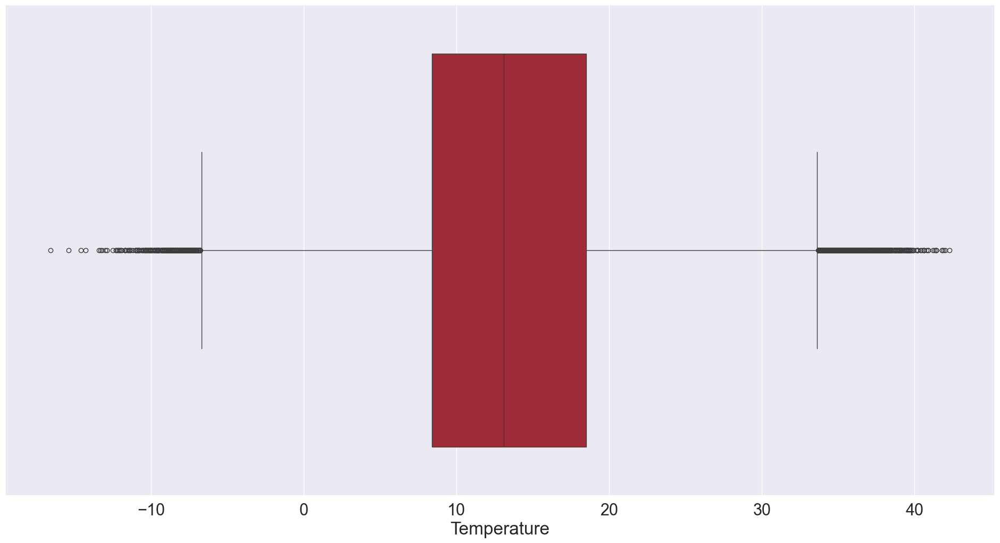

In [14]:
plt.figure(figsize=(24,12))
sns.boxplot(data=donnees.loc[donnees.Temperature < 45,'Temperature'], orient='h', color=palette[0]);
plt.show()

In [15]:
donnees.describe()

,DirectionVent,VitesseVent,Temperature,Humidite,Visibilite,Pression,Mois,Annee,AnneeMois,AnneeJour,Semaine,MoisJour,JourA,Precipitation
count,829027.000000,829125.000000,819837.000000,819239.000000,784564.000000,820839.000000,831725.000000,831725.000000,831725.000000,8.317250e+05,831725.0,831725.000000,831725.000000,818709.000000
mean,187.759675,3.749801,13.561843,73.991640,25.966030,996.171566,6.399180,2019.780058,201984.405011,2.019796e+06,26.097622,655.627193,179.368177,0.233607
std,105.721538,2.608443,7.429460,18.408379,16.739737,25.208011,3.402017,1.915185,191.344629,1.915224e+03,14.867906,340.414512,104.034886,1.214407
min,0.000000,0.000000,-16.600000,1.000000,0.000000,882.700000,1.000000,2017.000000,201701.000000,2.017001e+06,1.0,101.000000,1.000000,-0.300000
25%,100.000000,1.900000,8.400000,62.000000,15.140000,987.200000,3.000000,2018.000000,201809.000000,2.018022e+06,13.0,330.000000,89.000000,0.000000
50%,200.000000,3.200000,13.100000,78.000000,20.000000,1003.400000,6.000000,2020.000000,202003.000000,2.020007e+06,26.0,627.000000,179.000000,0.000000
75%,270.000000,5.000000,18.500000,89.000000,37.030000,1012.600000,9.000000,2022.000000,202202.000000,2.022004e+06,39.0,925.000000,268.000000,0.000000
max,360.000000,47.200000,42.300000,100.000000,80.010000,1047.800000,12.000000,2023.000000,202310.000000,2.023031e+06,53.0,1231.000000,366.000000,111.800000


In [16]:
donnees[donnees.Temperature > 44]

,,,,,,DirectionVent,VitesseVent,Temperature,Humidite,Visibilite,Pression,Mois,Annee,AnneeMois,AnneeJour,Semaine,MoisJour,JourA,Precipitation
Nom,Latitude,Longitude,Altitude,Zone,DateHeure,,,,,,,,,,,,,,


## Air quality Datas

In [17]:

airQuality = pd.read_csv('AirQualityUCI01.csv',
                           sep=',',
                          # usecols=['numer_sta','date','dd','ff','t','u','vv',
                          #         'pres','rr1','rr3','rr6','rr12','rr24'],
                           na_values='mq',
                           dtype={'CO(GT)':float,'Date':str, 'Time':str},
                          )
airQuality.drop(columns=['Unnamed: 15', 'Unnamed: 16'], inplace=True)
airQuality.replace('NaN', None, inplace=True)
airQuality['CO(GT)'].replace(-200, None, inplace=True)
airQuality['C6H6(GT)'].replace(-200, None, inplace=True)
airQuality['NOx(GT)'].replace(-200, None, inplace=True)
airQuality['NO2(GT)'].replace(-200, None, inplace=True)
airQuality['NMHC(GT)'].replace(-200, None, inplace=True)
airQuality['T'].replace(-200, None, inplace=True)
airQuality['RH'].replace(-200, None, inplace=True)
airQuality['AH'].replace(-200, None, inplace=True)
airQuality.head(4500)
airQuality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       914 non-null    object 
 5   C6H6(GT)       8991 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        7718 non-null   object 
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        7715 non-null   object 
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              8991 non-null   object 
 13  RH             8991 non-null   object 
 14  AH             8991 non-null   object 
dtypes: float64(5), object(10)
memory usage: 1.1+ MB


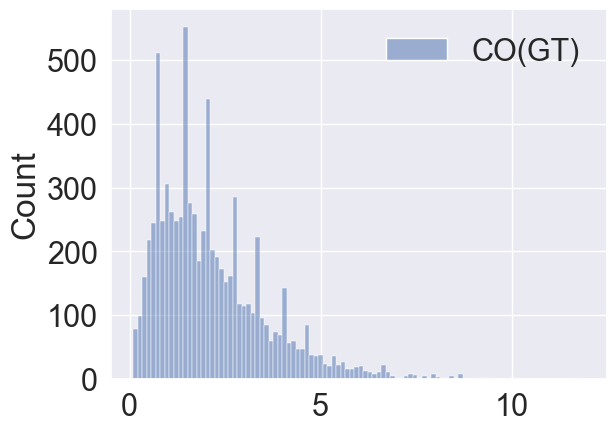

In [18]:
sns.histplot([airQuality['CO(GT)'], ], bins=100, color=palette[0])
plt.show()

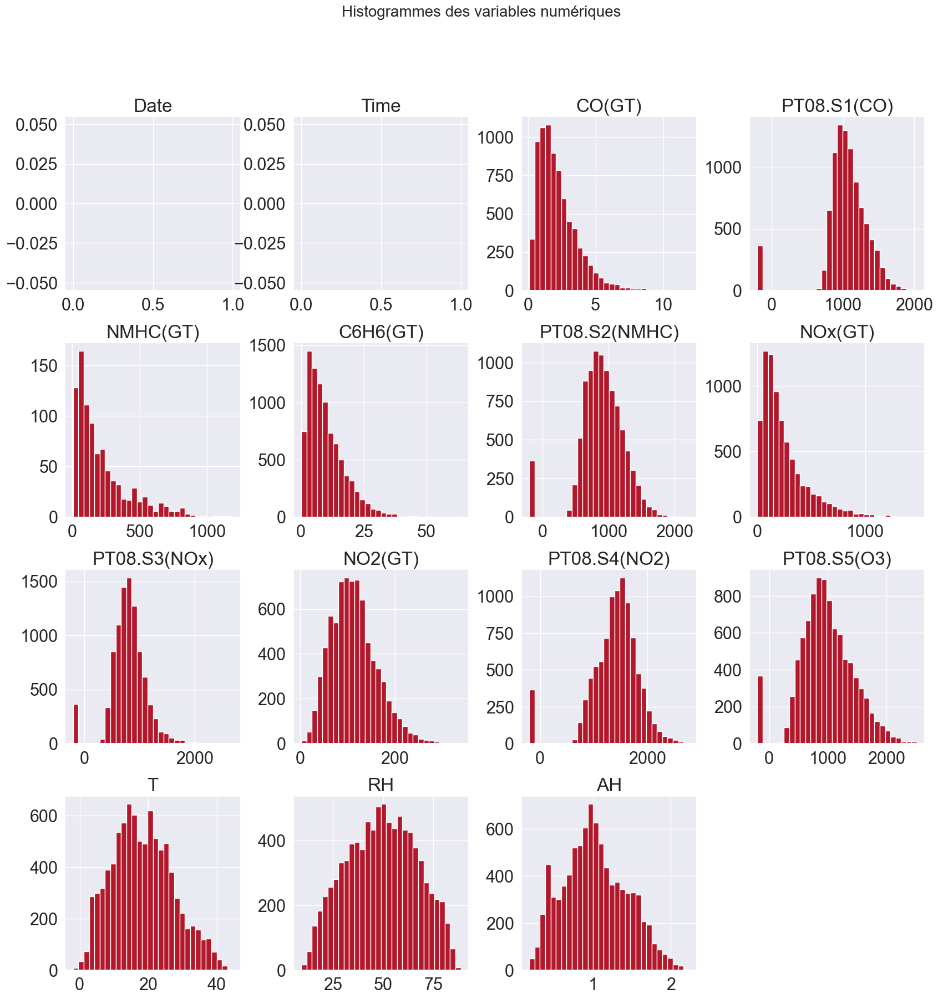

In [19]:
donnees_numeric = airQuality.apply(pd.to_numeric, errors='coerce')
donnees_numeric.hist(figsize=(20, 20), bins=30, color=palette[0])
plt.suptitle('Histogrammes des variables numériques', fontsize=20)
plt.gcf()

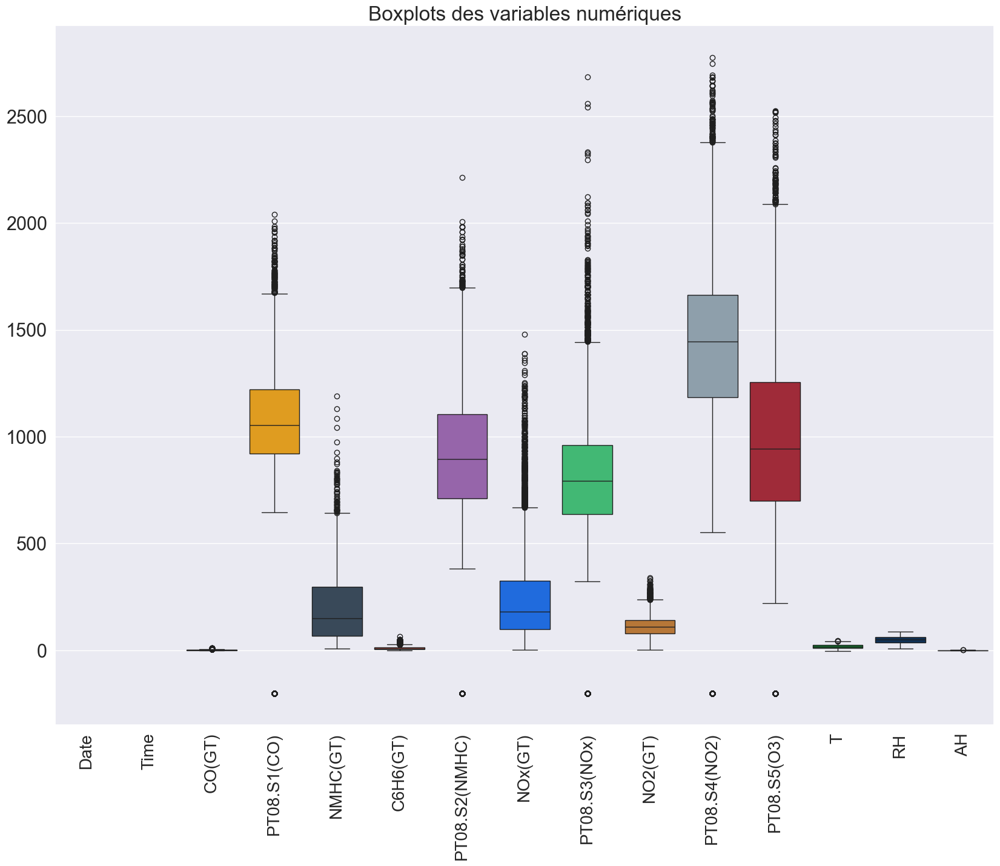

In [20]:
plt.figure(figsize=(20, 15))
sns.boxplot(data=donnees_numeric, palette=palette)
plt.title('Boxplots des variables numériques', fontproperties=font2)
plt.xticks(rotation=90, fontproperties=font1)
plt.gcf()

## Scatter Plot

In [21]:
donnees_numeric.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

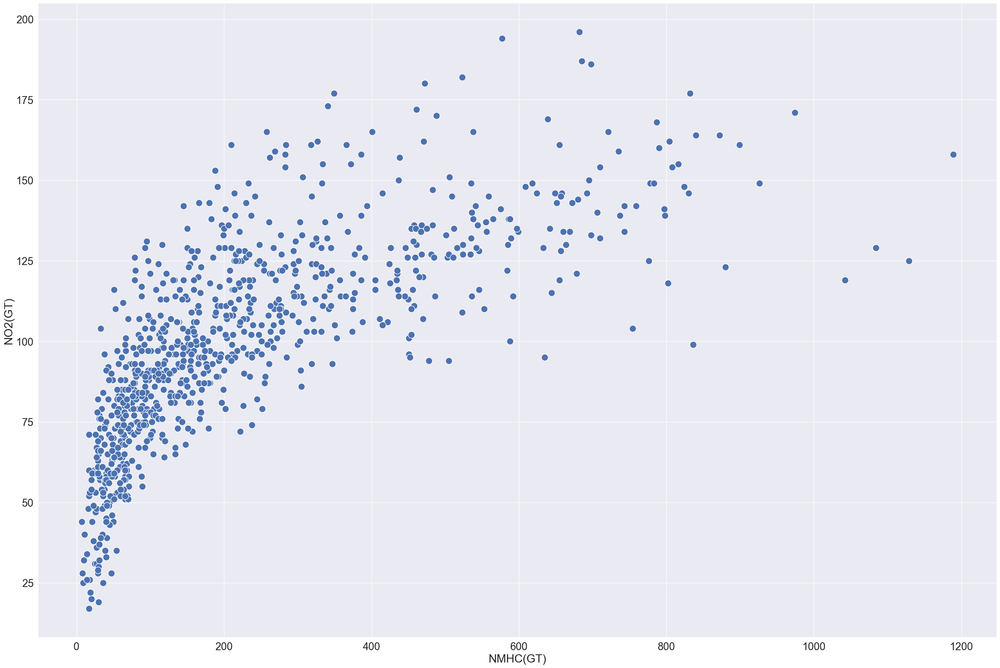

In [22]:
plt.figure(figsize=(36,24))
sns.scatterplot(x     = 'NMHC(GT)',
                y     = 'NO2(GT)',
               # hue   = 'categorie', 
                data  = donnees_numeric,
                s     = 200,
                palette= palette,
                );
plt.gcf()

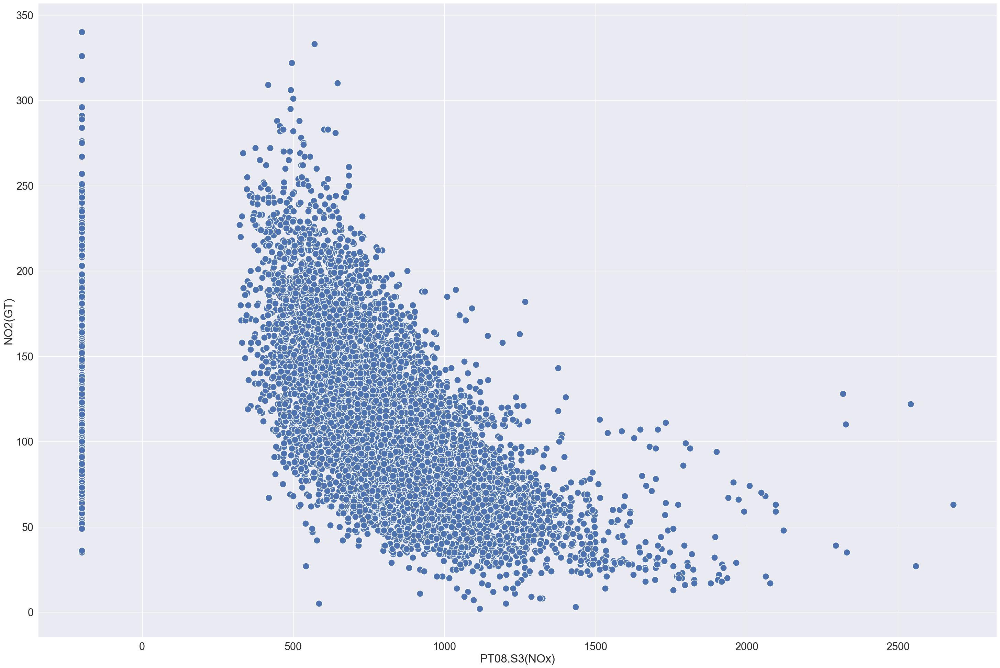

In [23]:
plt.figure(figsize=(36,24))
sns.scatterplot(x     = 'PT08.S3(NOx)',
                y     = 'NO2(GT)',
               # hue   = 'categorie', 
                data  = donnees_numeric,
                s     = 200,
                palette= palette,
                );
plt.gcf()

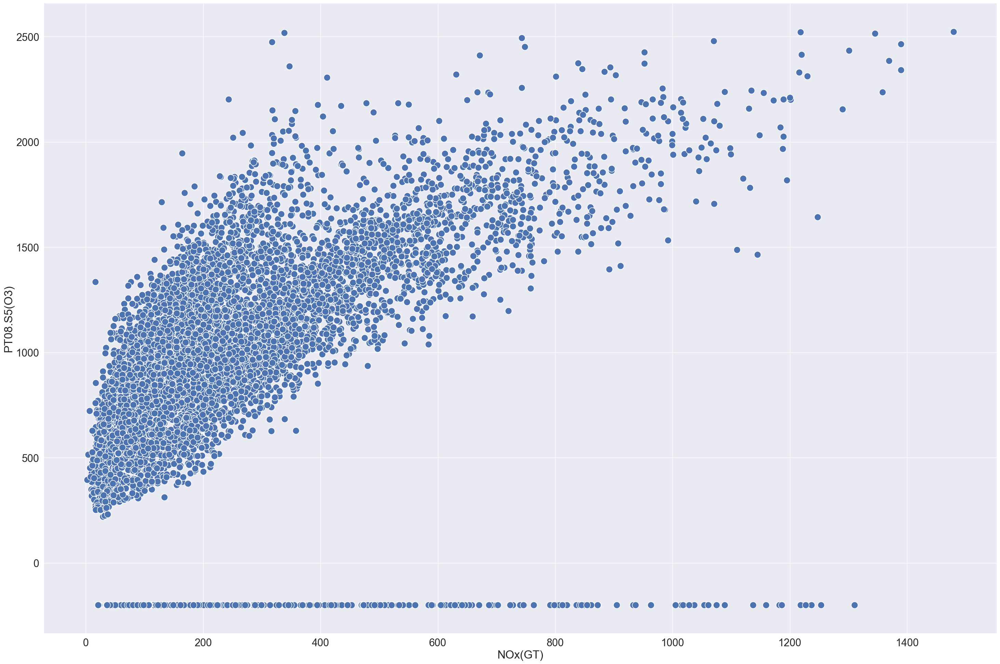

In [24]:
plt.figure(figsize=(36,24))
sns.scatterplot(x     = 'NOx(GT)',
                y     = 'PT08.S5(O3)',
               # hue   = 'categorie', 
                data  = donnees_numeric,
                s     = 200,
                palette= palette,
                );
plt.gcf()

## Linear Plot

In [ ]:
plt.figure(figsize=(24,12))

ax = sns.lineplot(x  ='PT08.S5(O3)',
                  y  ='NOx(GT)',
                  #hue='annee',             
                  data=donnees_numeric, 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
#ax.set_xticklabels(donnees_numeric.Time,rotation=90);
plt.gcf()

NameError: name 'plt' is not defined

In [26]:
donnees_numeric.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')

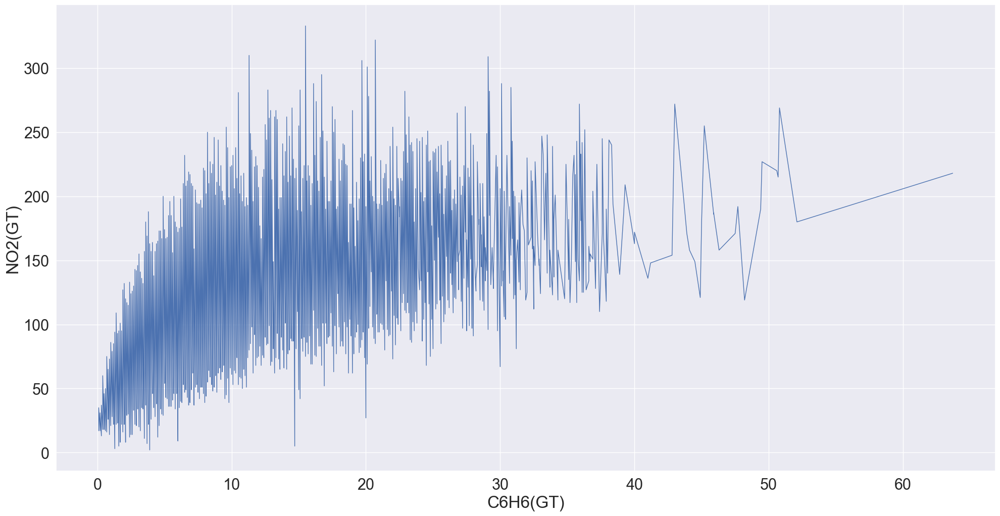

In [27]:
plt.figure(figsize=(24,12))

ax = sns.lineplot(x  ='C6H6(GT)',
                  y  ='NO2(GT)',
                  #hue='annee',             
                  data=donnees_numeric, 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
#ax.set_xticklabels(donnees_numeric.Time,rotation=90);
plt.gcf()

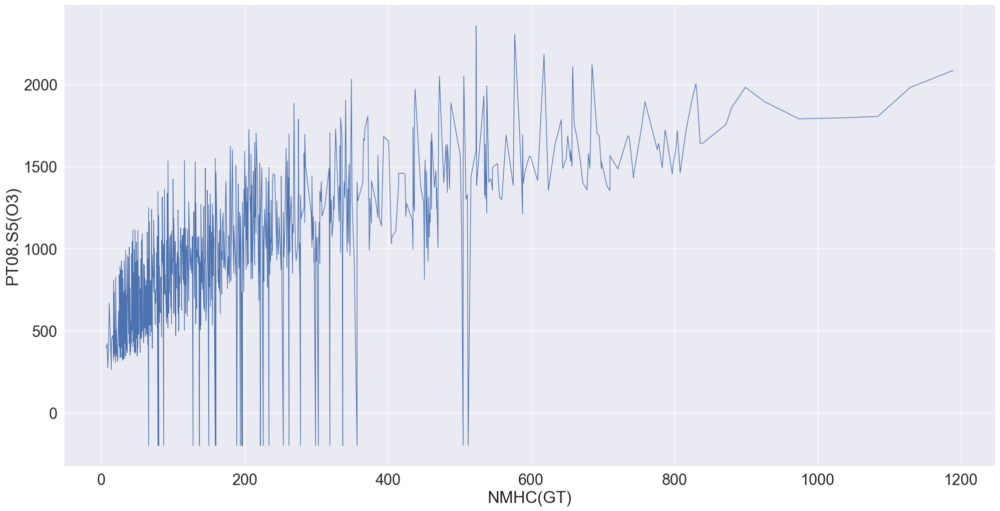

In [28]:
plt.figure(figsize=(24,12))

ax = sns.lineplot(x  ='NMHC(GT)',
                  y  ='PT08.S5(O3)',
                  #hue='annee',             
                  data=donnees_numeric, 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
#ax.set_xticklabels(donnees_numeric.Time,rotation=90);
plt.gcf()

In [29]:
airQuality['Date'] =  pd.to_datetime(airQuality['Date'], errors='coerce')
airQuality.info()


# do = airQuality.goupby('Date').agg({'NMHC(GT)':['count']}

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           3597 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         7674 non-null   object        
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       914 non-null    object        
 5   C6H6(GT)       8991 non-null   object        
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        7718 non-null   object        
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        7715 non-null   object        
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              8991 non-null   object        
 13  RH             8991 non-null   object        
 14  AH             8991 non-null   object        
dtypes: datetime64[ns](1),

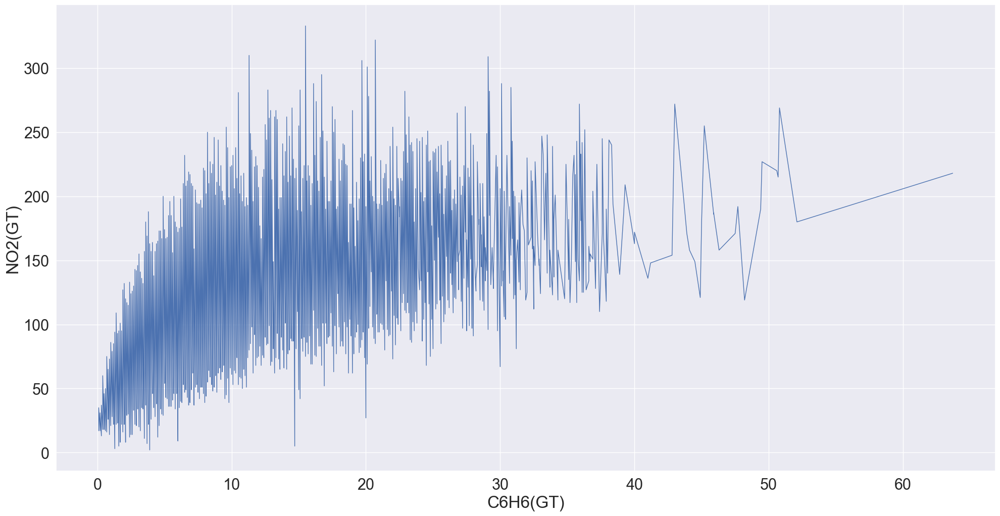

In [30]:
plt.figure(figsize=(24,12))

ax = sns.lineplot(x  ='C6H6(GT)',
                  y  ='NO2(GT)',
                  #hue='annee',             
                  data=donnees_numeric, 
                  estimator=None, 
                  lw=1, 
                  ci=None, 
                  palette= palette);
#ax.set_xticklabels(donnees_numeric.Time,rotation=90);
plt.gcf()

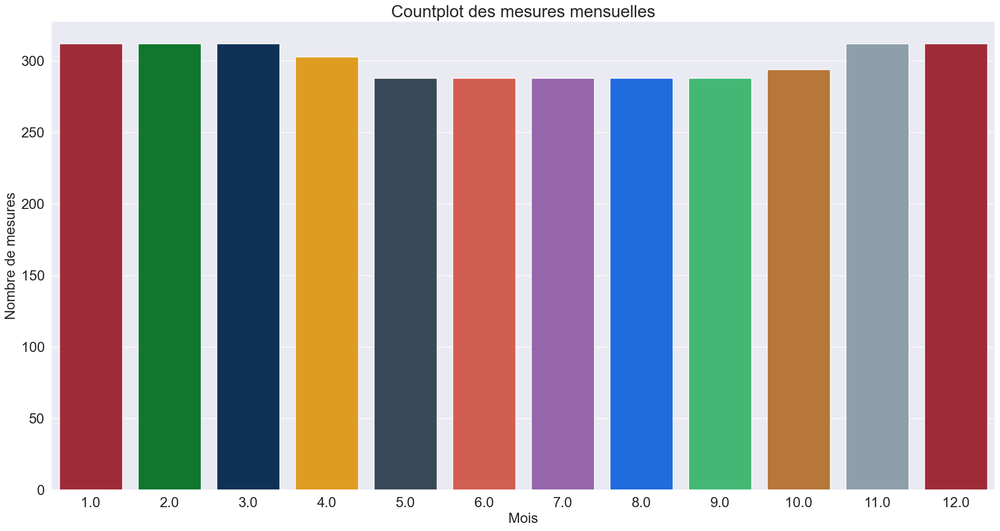

In [31]:
# Extract month from the Date column
airQuality['Month'] = airQuality['Date'].dt.month

# Plot countplot for monthly measurements
plt.figure(figsize=(24,12))
sns.countplot(x='Month', data=airQuality, palette=palette)
plt.title('Countplot des mesures mensuelles', fontproperties=font2)
plt.xlabel('Mois', fontproperties=font1)
plt.ylabel('Nombre de mesures', fontproperties=font1)
plt.xticks(fontproperties=font1)
plt.yticks(fontproperties=font1)
plt.gcf()

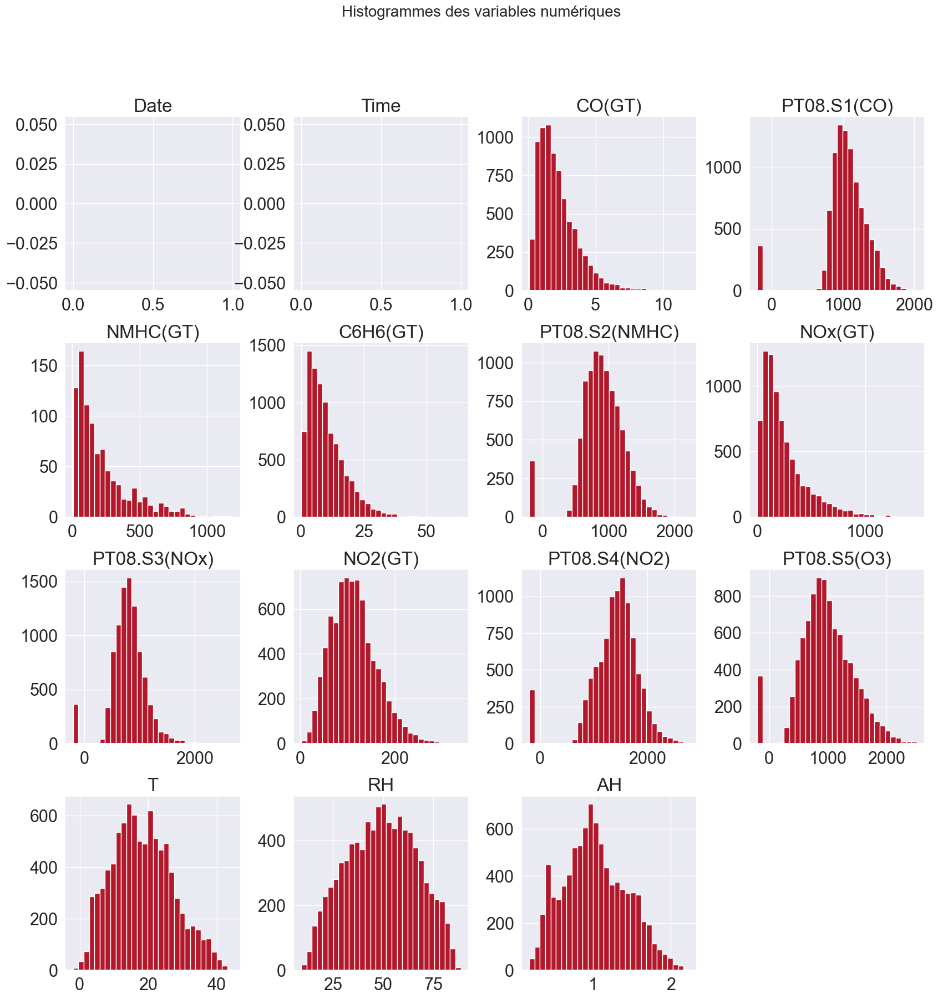

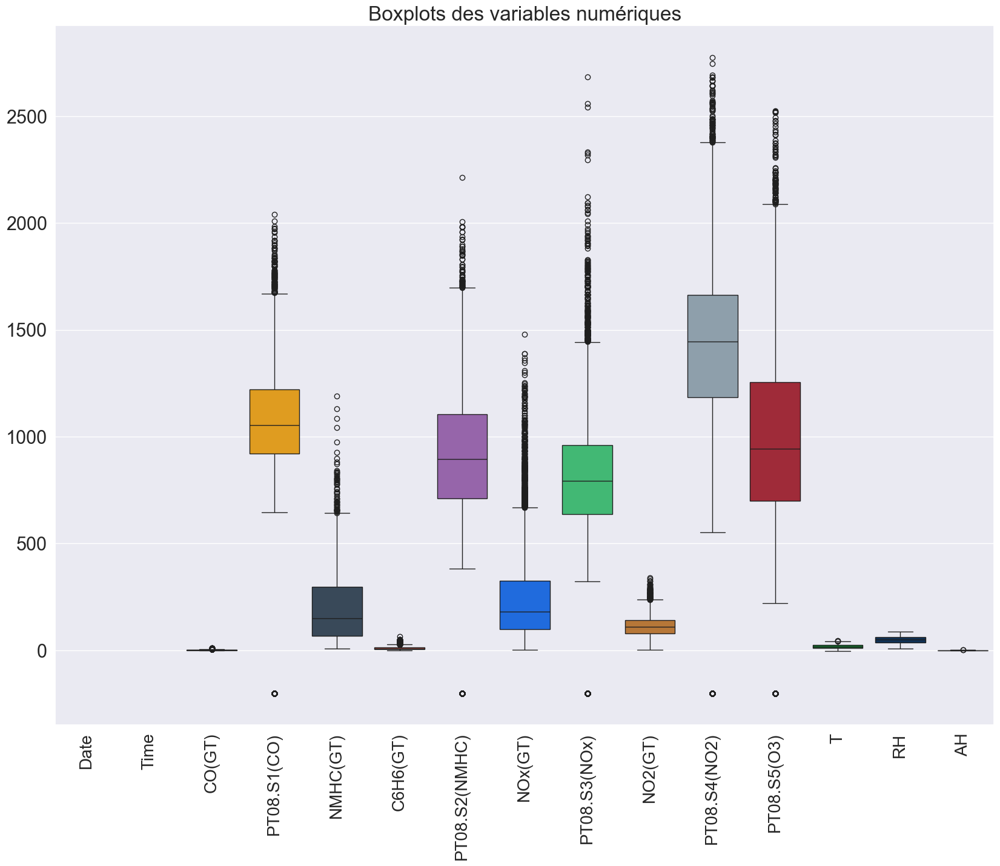

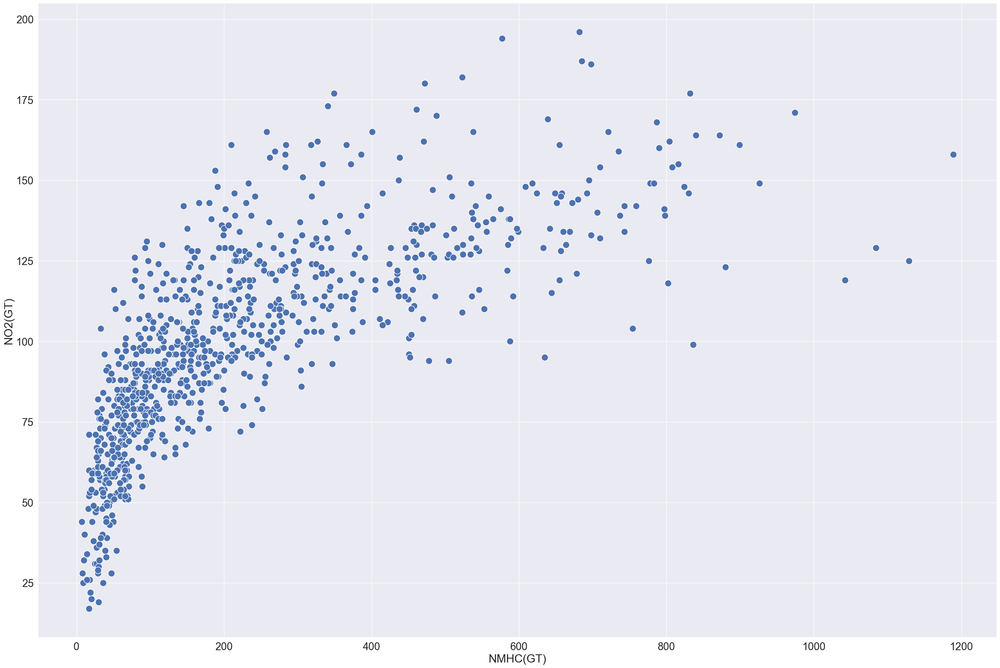

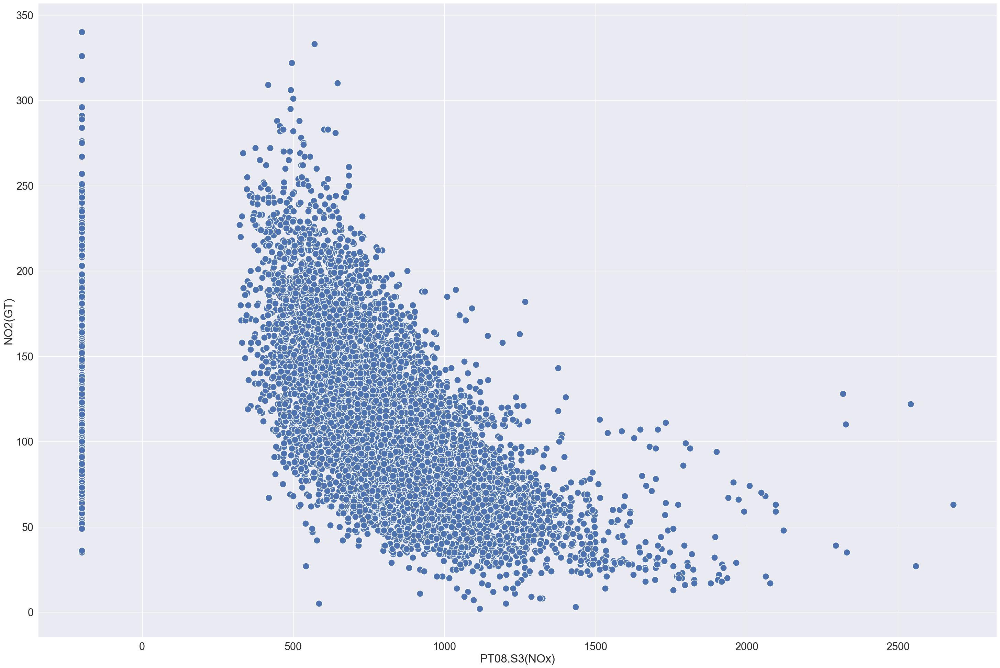

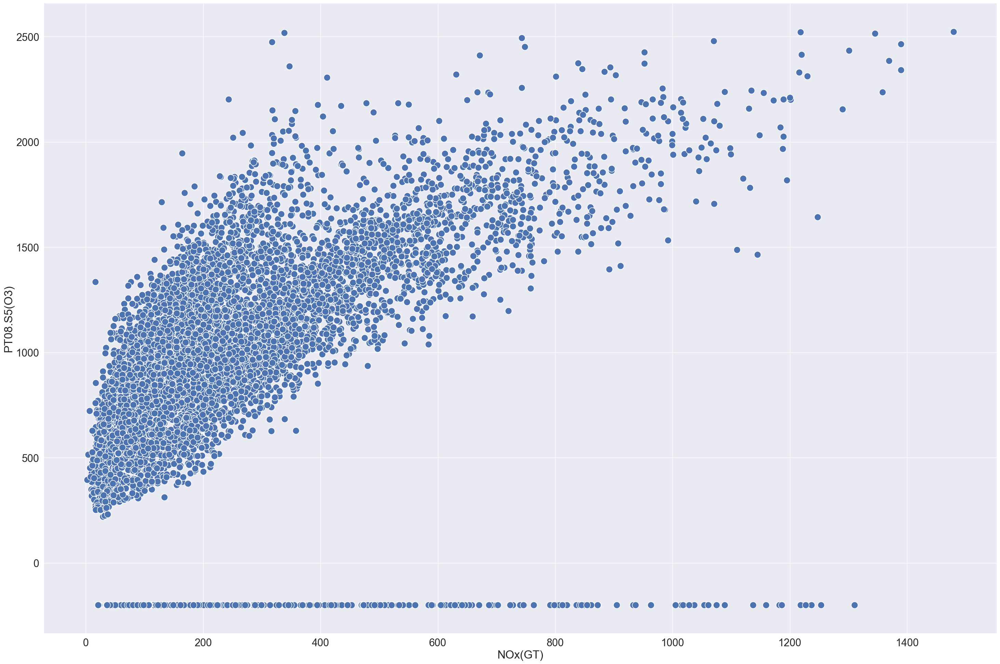

...

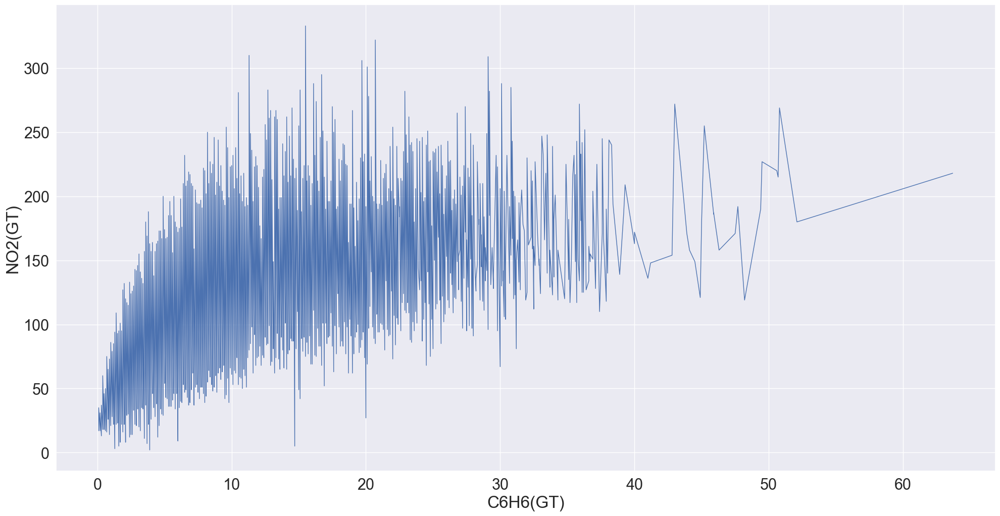

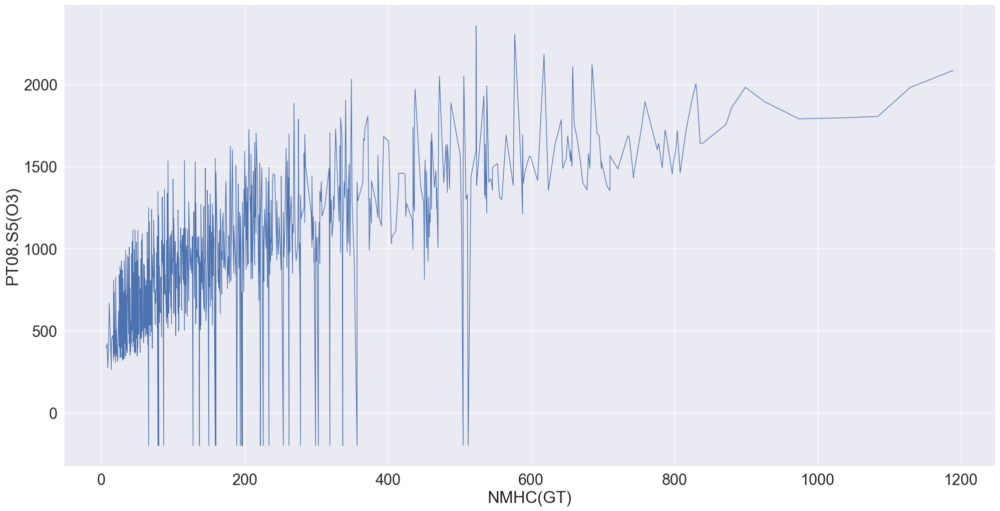

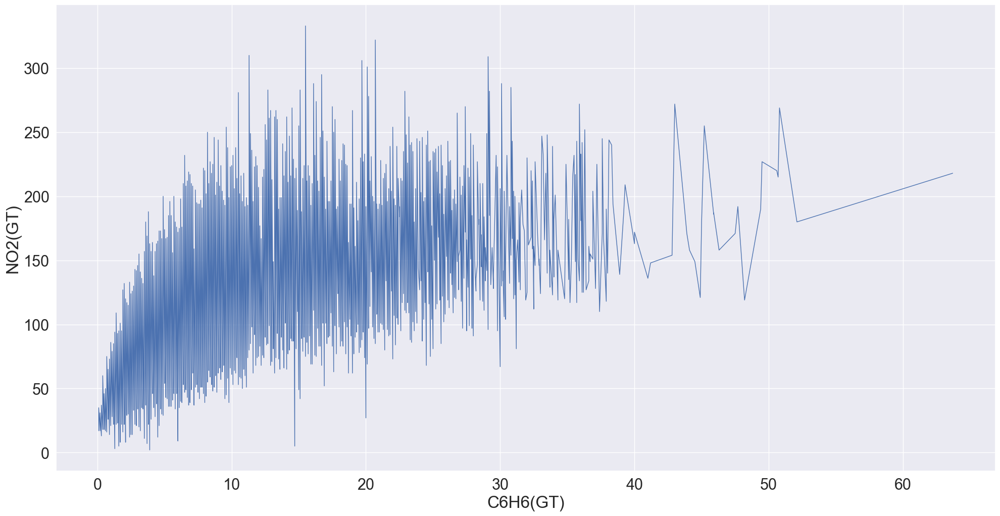

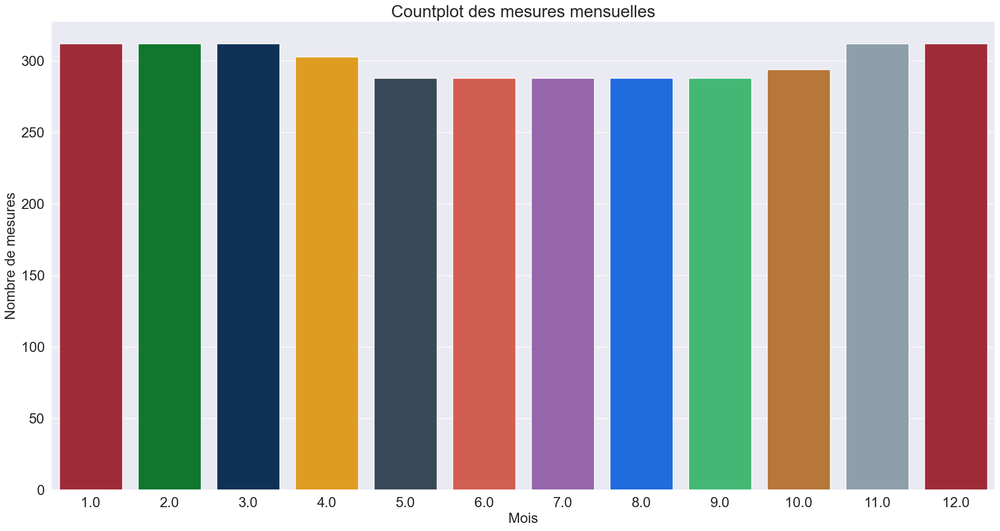

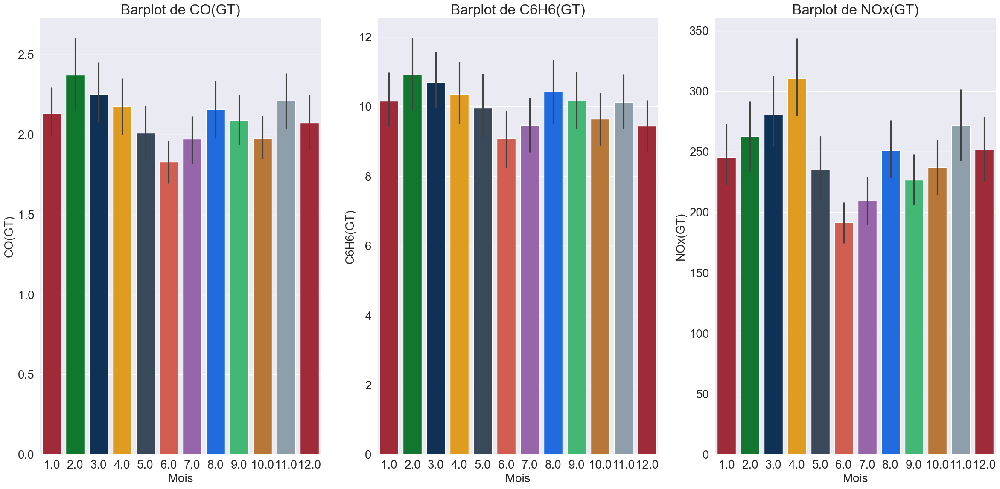

In [32]:
# Sélection des variables numériques pour les barplots
variables = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)']


# Tracer les barplots
plt.figure(figsize=(24, 12))

for i, var in enumerate(variables, 1):
    plt.subplot(1, 3, i)
    sns.barplot(x=airQuality['Month'], y=airQuality[var], palette=palette)
    plt.title(f'Barplot de {var}', fontproperties=font2)
    plt.xlabel('Mois', fontproperties=font1)
    plt.ylabel(var, fontproperties=font1)
    plt.xticks(fontproperties=font1)
    plt.yticks(fontproperties=font1)

plt.tight_layout()
plt.show()


In [33]:
donneesM = airQuality.melt(id_vars=['Month'], value_vars=['CO(GT)', 'T', 'RH', 'AH'])
donneesM

,Month,variable,value
0,10.0,CO(GT),2.6
1,10.0,CO(GT),2.0
2,10.0,CO(GT),2.2
3,10.0,CO(GT),2.2
4,10.0,CO(GT),1.6
...,...,...,...
37879,NaN,AH,NaN
37880,NaN,AH,NaN
37881,NaN,AH,NaN
37882,NaN,AH,NaN


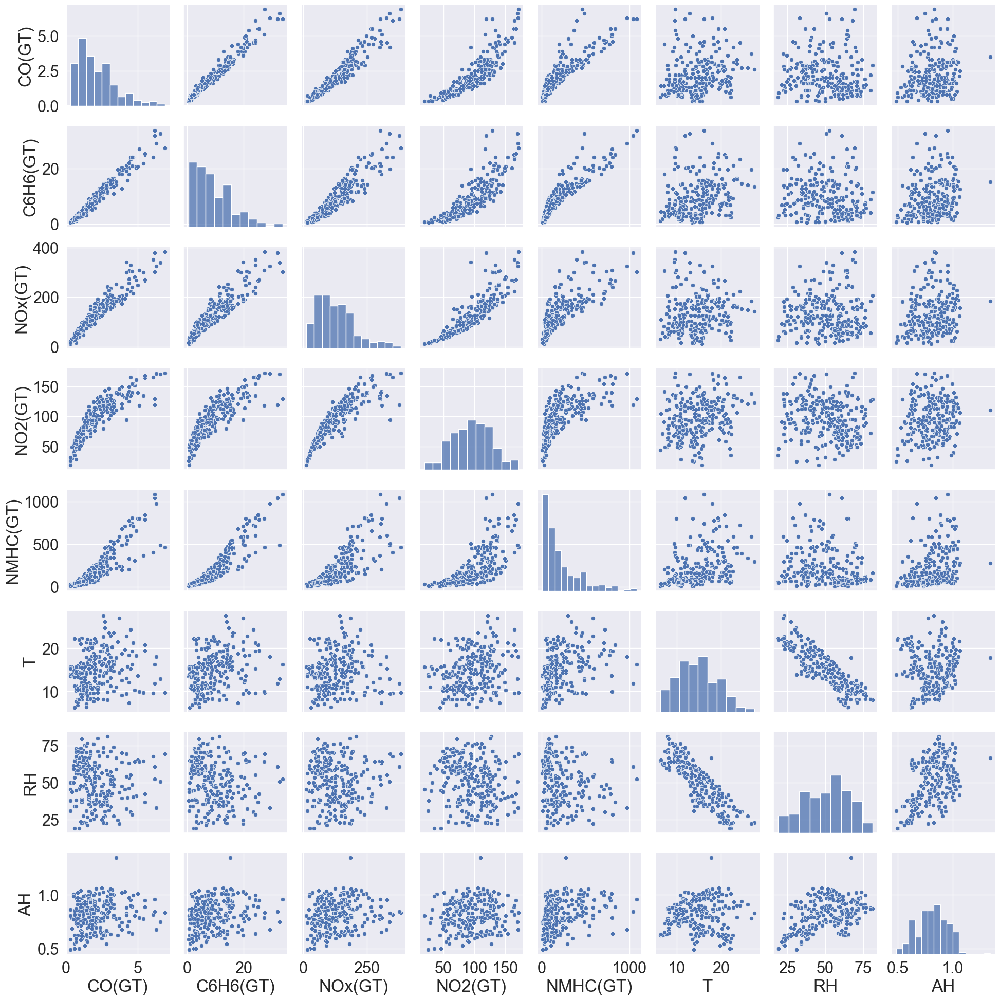

In [ ]:
# Create a pairplot with the airQuality data
sns.pairplot(airQuality.dropna(), 
             vars=['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)', 'NMHC(GT)', 'T', 'RH', 'AH'], 
             palette=palette)
plt.gcf()

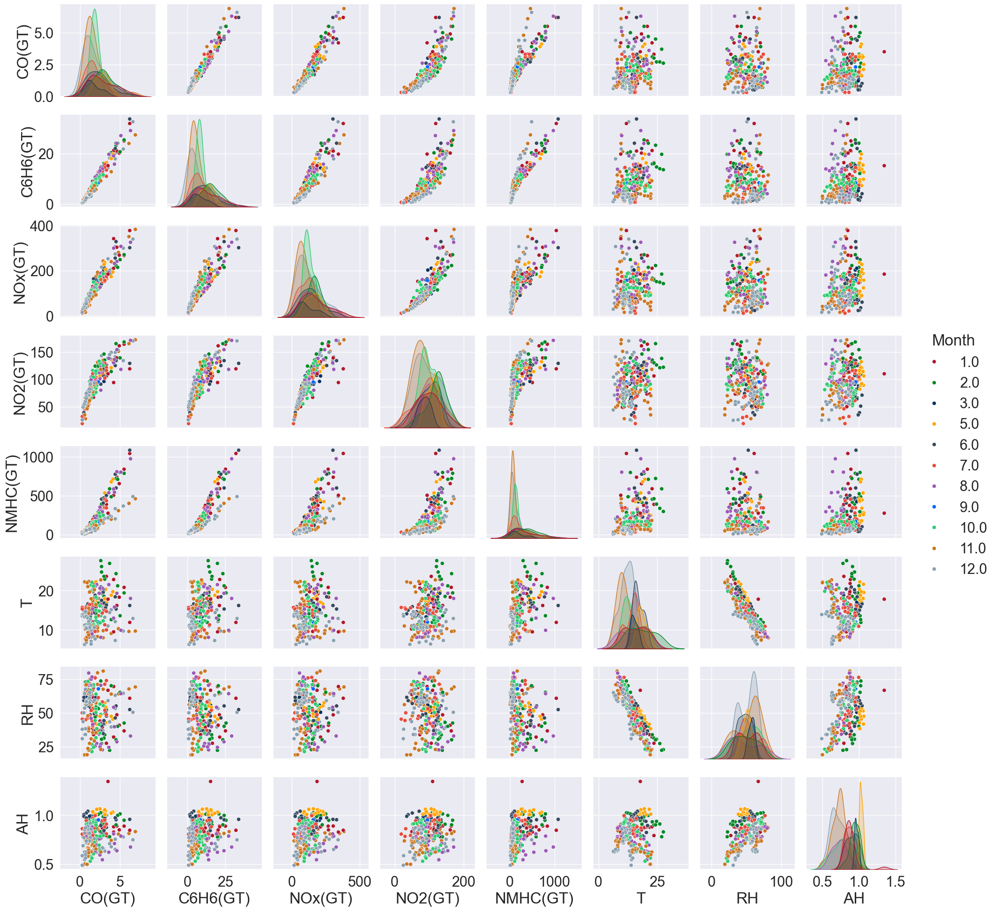

In [38]:
sns.pairplot(airQuality.dropna(), 
             vars=['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)', 'NMHC(GT)', 'T', 'RH', 'AH'], 
             hue='Month', 
             palette=palette)
plt.gcf()